In [ ]:
!nvidia-smi

Sun Feb 18 10:08:39 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   62C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
# Pip install method

!pip install ultralytics

from IPython import display

import ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 715.1/715.1 kB 9.3 MB/s eta 0:00:00


In [ ]:

from ultralytics import YOLO

from IPython.display import display, Image

In [ ]:
%cd {HOME}
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="nxKQmigopMbRMy7u295N")
project = rf.workspace("hust-ajpvu").project("food-srnub")
dataset = project.version(1).download("yolov8")


/content
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.2/70.2 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 26.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.0 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
  Attempting uninstall: cycler
    Found existing installati

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.1.15, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to food-1 in yolov8:: 100%|██████████| 18312/18312 [00:03<00:00, 5930.93it/s]


In [ ]:
%cd {HOME}
!yolo task=segment mode=train model=yolov8l-seg.pt data={dataset.location}/data.yaml epochs=25 imgsz=640

/content
100% 88.1M/88.1M [00:00<00:00, 238MB/s]
Ultralytics YOLOv8.1.15 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8l-seg.pt, data=/content/food-1/data.yaml, epochs=25, time=None, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save

In [ ]:
!ls  {HOME}/runs/segment/train/

args.yaml					   results.png
BoxF1_curve.png					   train_batch0.jpg
BoxP_curve.png					   train_batch1.jpg
BoxPR_curve.png					   train_batch2.jpg
BoxR_curve.png					   train_batch6015.jpg
confusion_matrix_normalized.png			   train_batch6016.jpg
confusion_matrix.png				   train_batch6017.jpg
events.out.tfevents.1696519265.d7d389db24f3.863.0  val_batch0_labels.jpg
labels_correlogram.jpg				   val_batch0_pred.jpg
labels.jpg					   val_batch1_labels.jpg
MaskF1_curve.png				   val_batch1_pred.jpg
MaskP_curve.png					   val_batch2_labels.jpg
MaskPR_curve.png				   val_batch2_pred.jpg
MaskR_curve.png					   weights
results.csv


/content


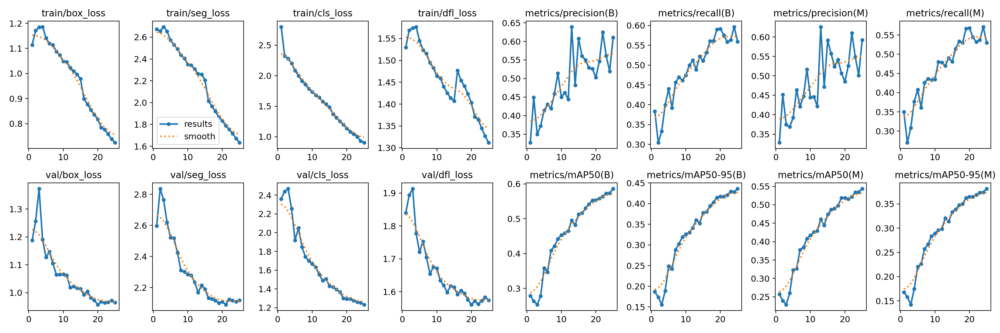

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/results.png',width=800)

/content


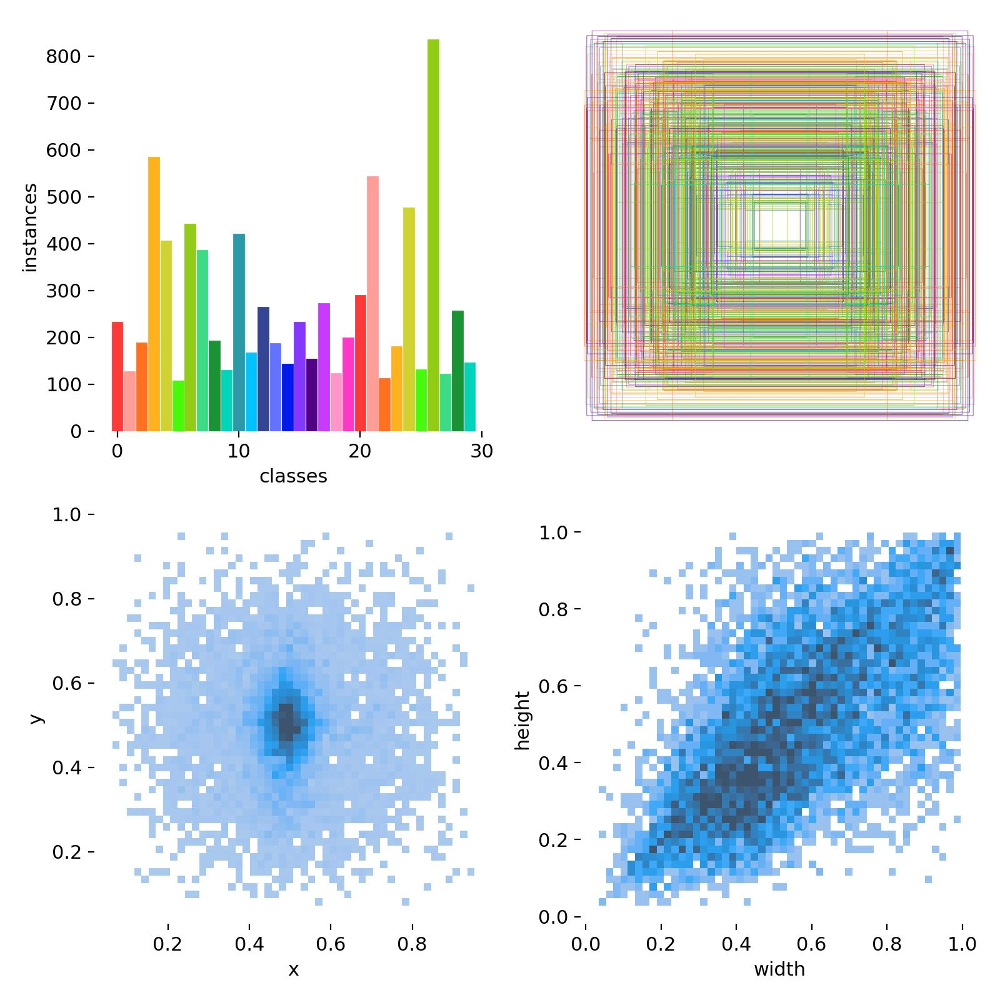

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/labels.jpg',width=800)

/content


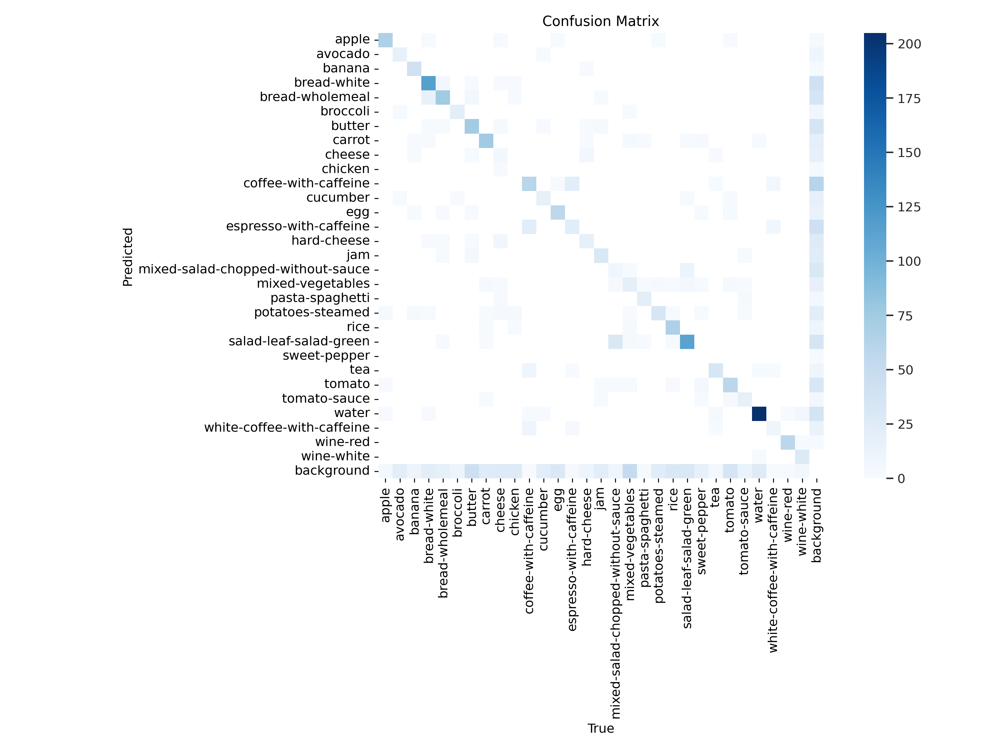

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/confusion_matrix.png',width=800)

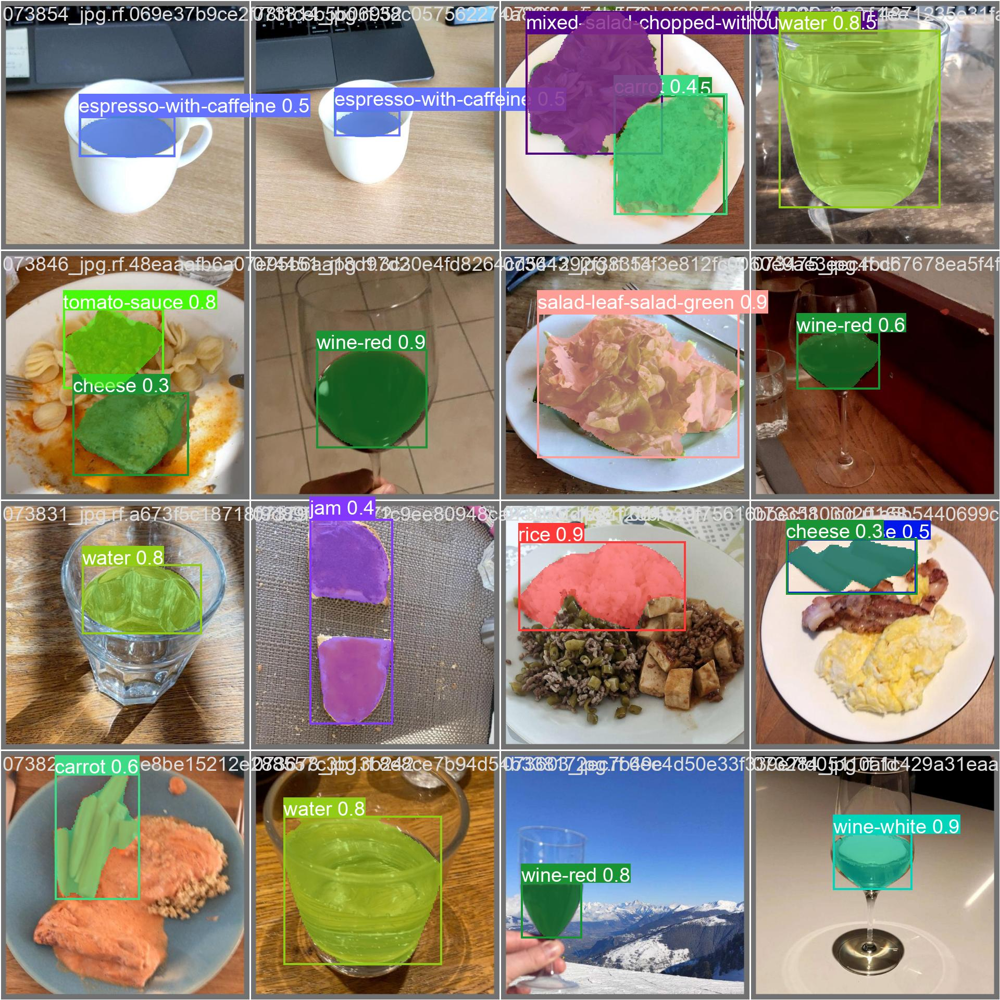

In [ ]:
Image(filename=f'/content/runs/segment/train/val_batch2_pred.jpg', width=900)

In [ ]:
#validate the model (not neccessary)
%cd {HOME}
!yolo task=segment mode=val model={HOME}/runs/segment/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.193 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l-seg summary (fused): 295 layers, 45935018 parameters, 0 gradients, 220.3 GFLOPs
val: Scanning /content/food-1/valid/labels.cache... 1830 images, 21 backgrounds, 0 corrupt: 100% 1830/1830 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% 115/115 [01:30<00:00,  1.27it/s]
                   all       1830       2283       0.61      0.556      0.586      0.436      0.594      0.527      0.544      0.381
                 apple       1830         76       0.83      0.842      0.923      0.825      0.866      0.855      0.932      0.836
               avocado       1830         43      0.605      0.372      0.412      0.321      0.614      0.372      0.403      0.315
                banana       1830         59      0.871      0.661      0.806      0.577      0.878      0.661      0.79

In [ ]:
#test the model
%cd {HOME}
!yolo task=segment mode=predict model={HOME}/runs/segment/train/weights/best.pt  conf=0.25 source={dataset.location}/test/images

/content
Ultralytics YOLOv8.0.193 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l-seg summary (fused): 295 layers, 45935018 parameters, 0 gradients, 220.3 GFLOPs

image 1/916 /content/food-1/test/images/006483_jpg.rf.0c5aca71beea343d6ddfb3e630d805ee.jpg: 640x640 (no detections), 60.9ms
image 2/916 /content/food-1/test/images/006512_jpg.rf.14db8d58beaa1872f1884f11fac86c44.jpg: 640x640 1 coffee-with-caffeine, 1 espresso-with-caffeine, 61.2ms
image 3/916 /content/food-1/test/images/006624_jpg.rf.2b7cd8071f898034eb29afd245b356ce.jpg: 640x640 (no detections), 43.8ms
image 4/916 /content/food-1/test/images/006639_jpg.rf.4bdfd29a6c6989e8134ad74e83b17a8a.jpg: 640x640 1 bread-white, 43.2ms
image 5/916 /content/food-1/test/images/006782_jpg.rf.3f326467b192f43289a33923fcc8339c.jpg: 640x640 1 egg, 43.0ms
image 6/916 /content/food-1/test/images/006801_jpg.rf.7e777900aa79f04d19563dad690d8e56.jpg: 640x640 1 white-coffee-with-caffeine, 38.3ms
image 7/916 /content/food-1/test/ima

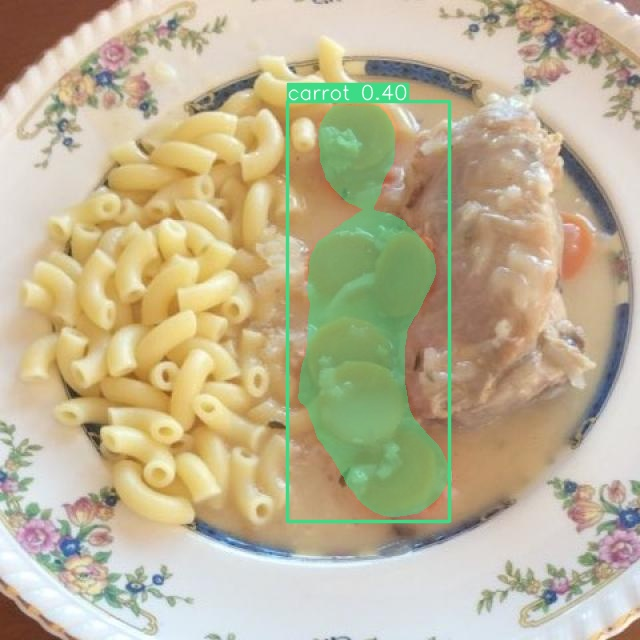

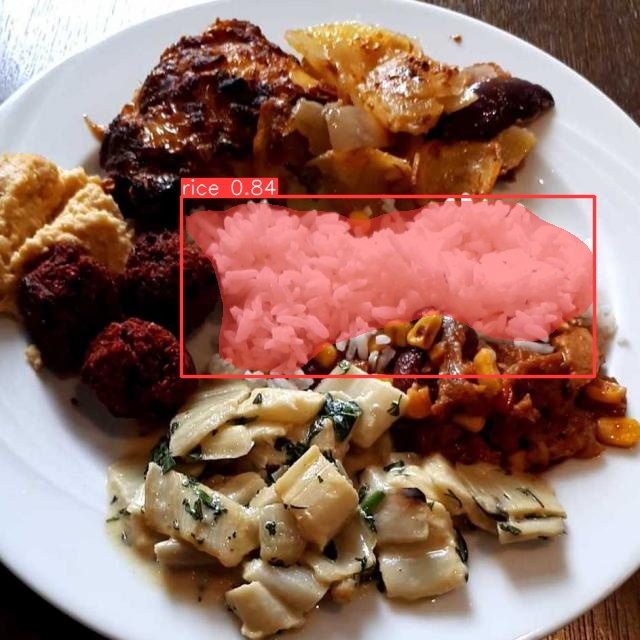

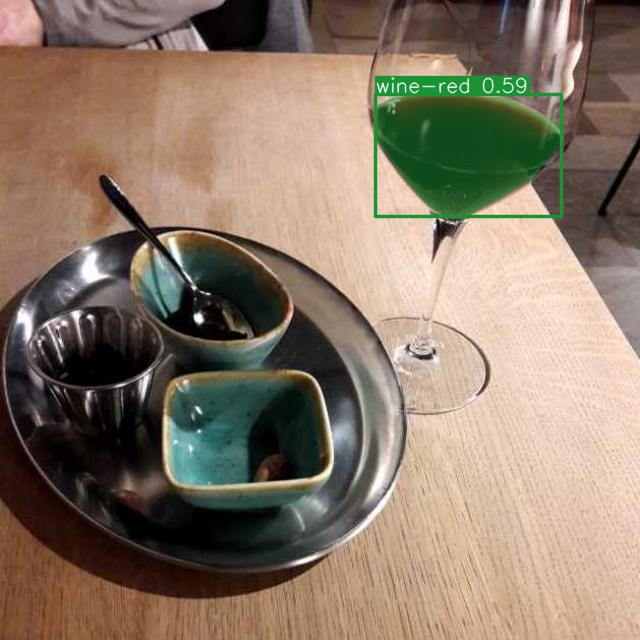

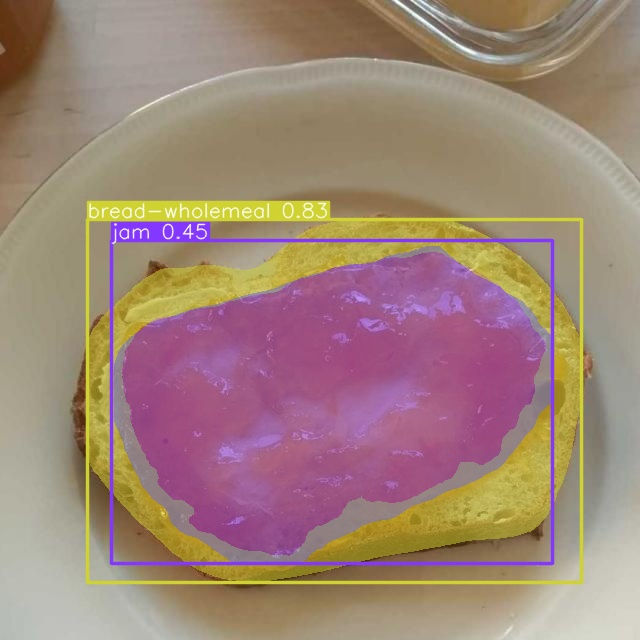

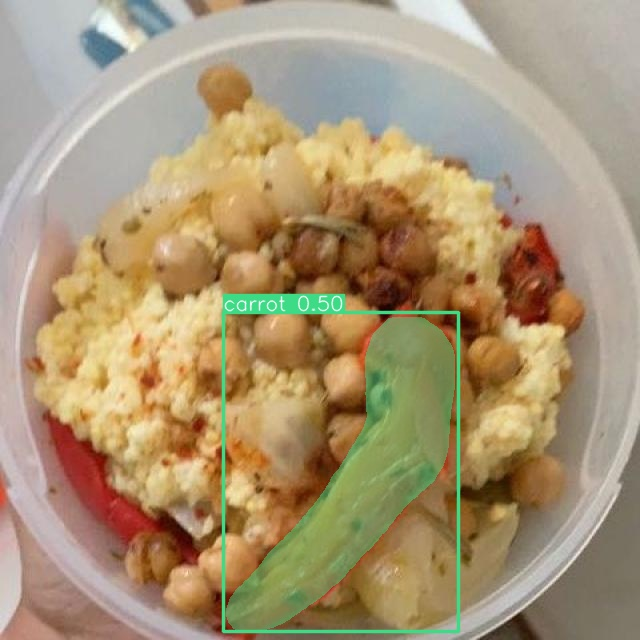

...

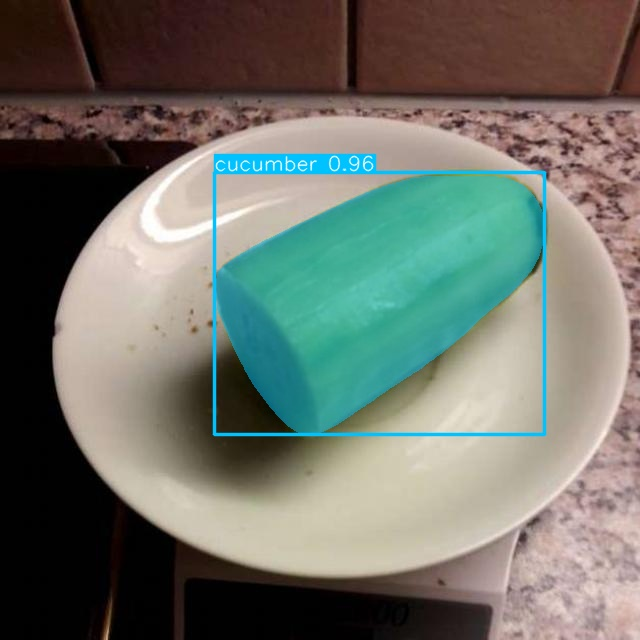

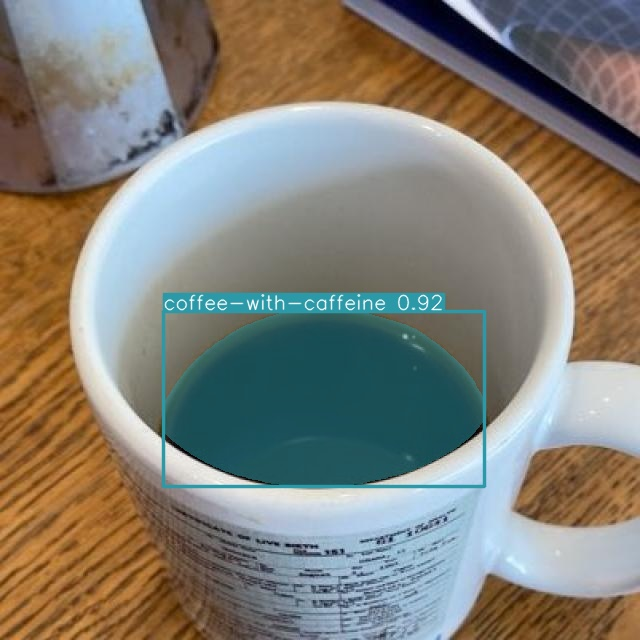

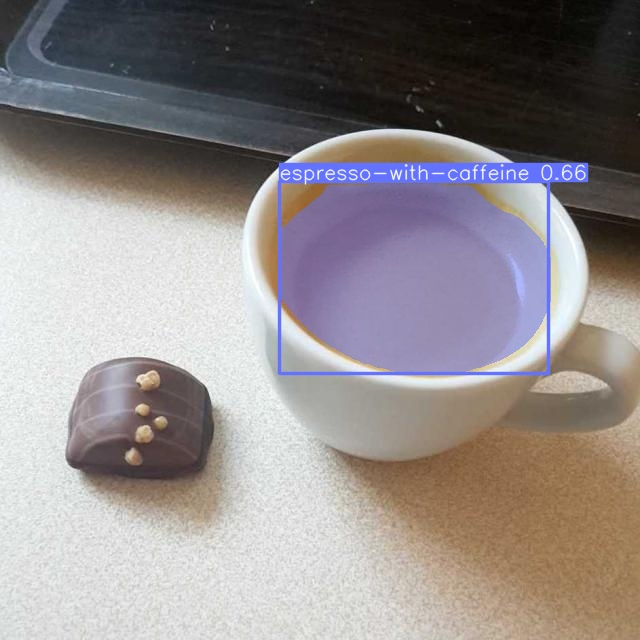

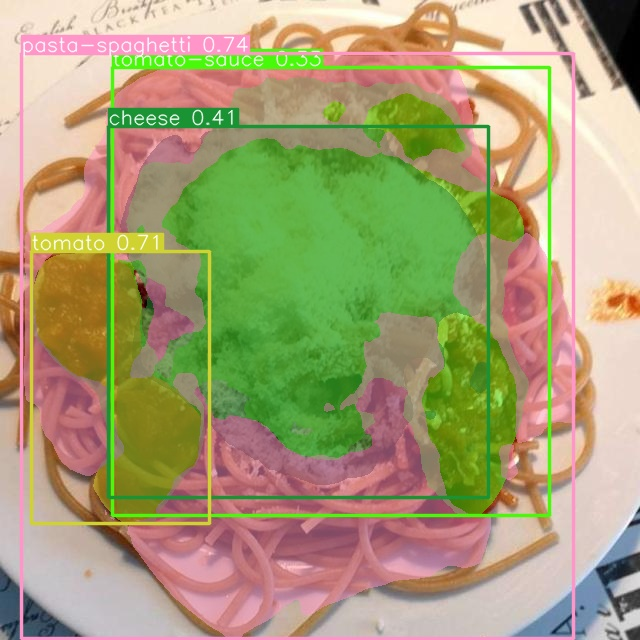

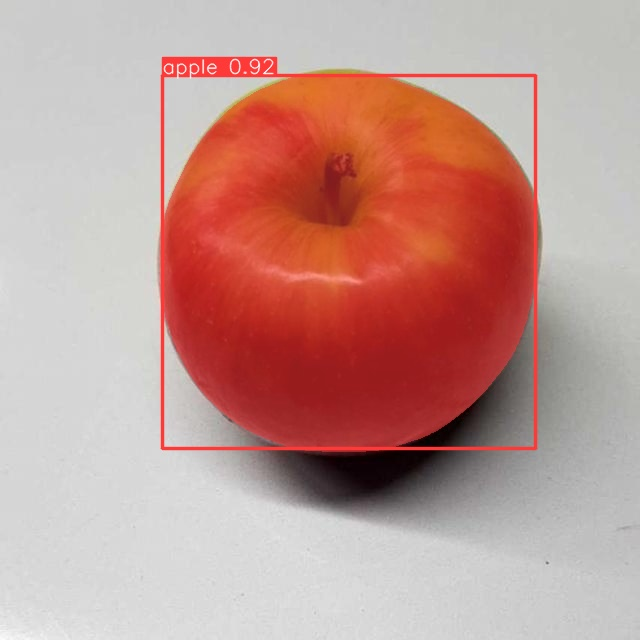

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/segment/predict/*.jpg')[:20]:
      display(Image(filename=image_path, width=600))
      print("\n")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!yolo task=segment mode=predict model={HOME}/runs/segment/train/weights/best.pt  conf=0.25 source='/content/drive/MyDrive/Test Pictures'

Ultralytics YOLOv8.0.193 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l-seg summary (fused): 295 layers, 45935018 parameters, 0 gradients, 220.3 GFLOPs

image 1/12 /content/drive/MyDrive/Test Pictures/1.jpg: 448x640 (no detections), 84.4ms
image 2/12 /content/drive/MyDrive/Test Pictures/10.jpg: 640x640 1 rice, 77.4ms
image 3/12 /content/drive/MyDrive/Test Pictures/11.jpg: 640x576 1 potatoes-steamed, 96.3ms
image 4/12 /content/drive/MyDrive/Test Pictures/12.jpg: 640x640 1 tomato, 77.7ms
image 5/12 /content/drive/MyDrive/Test Pictures/13.jpg: 640x480 2 mixed-vegetabless, 85.6ms
image 6/12 /content/drive/MyDrive/Test Pictures/14.jpg: 640x480 1 mixed-vegetables, 57.8ms
image 7/12 /content/drive/MyDrive/Test Pictures/15.jpg: 640x480 1 rice, 57.8ms
image 8/12 /content/drive/MyDrive/Test Pictures/16.jpg: 480x640 1 tomato-sauce, 81.6ms
image 9/12 /content/drive/MyDrive/Test Pictures/break fast.jpg: 640x640 1 egg, 1 tomato, 77.6ms
image 10/12 /content/drive/MyDrive/Test 

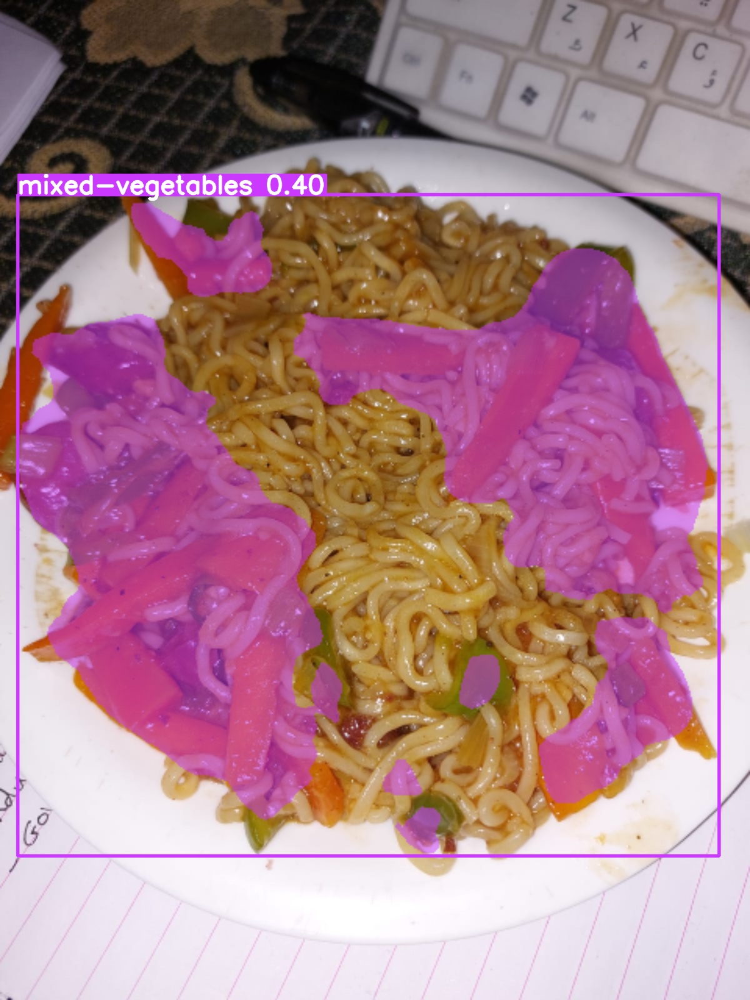

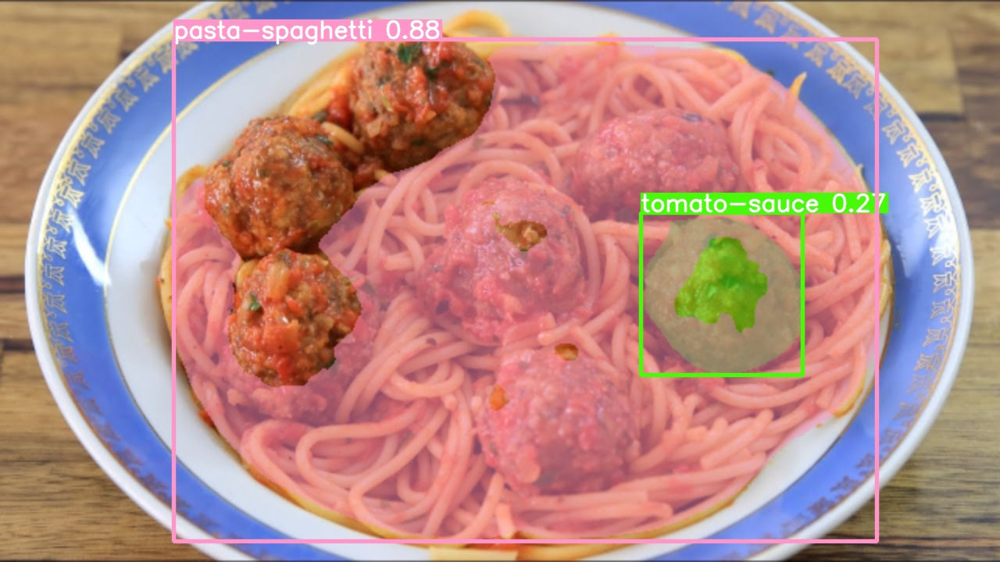

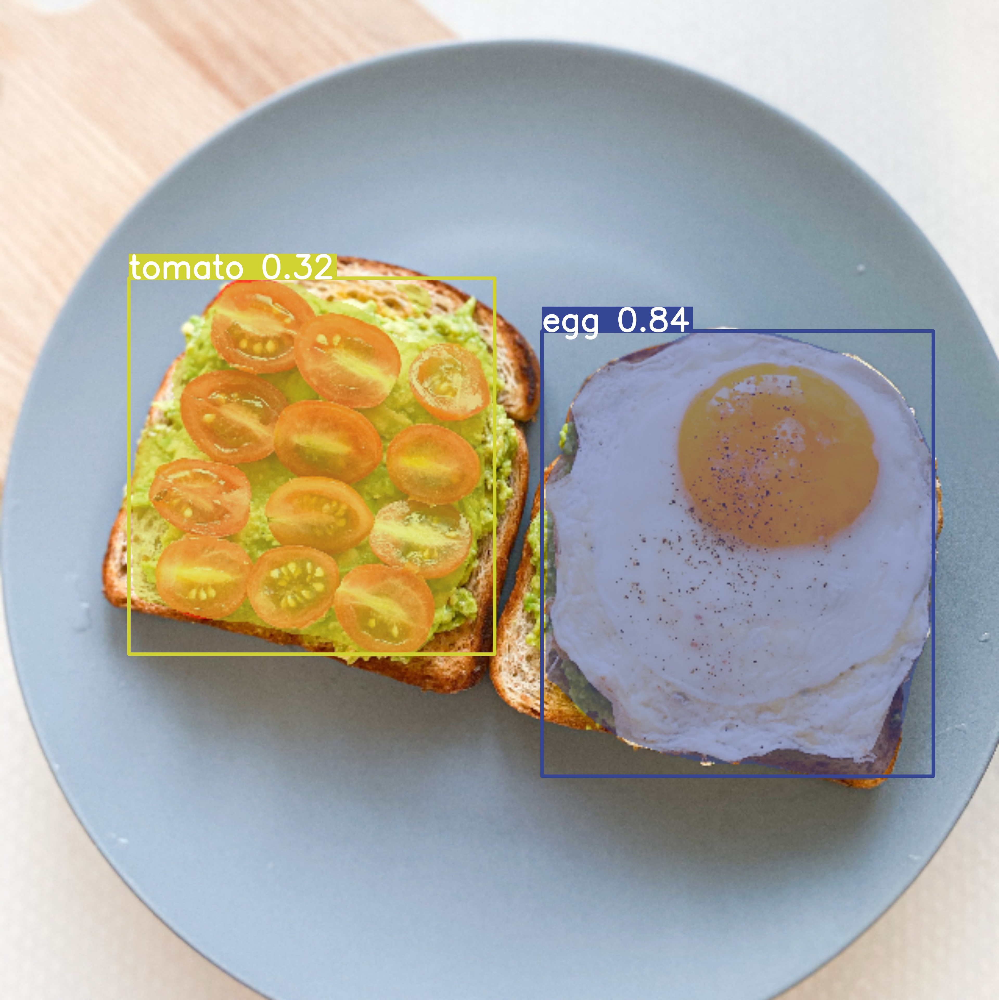

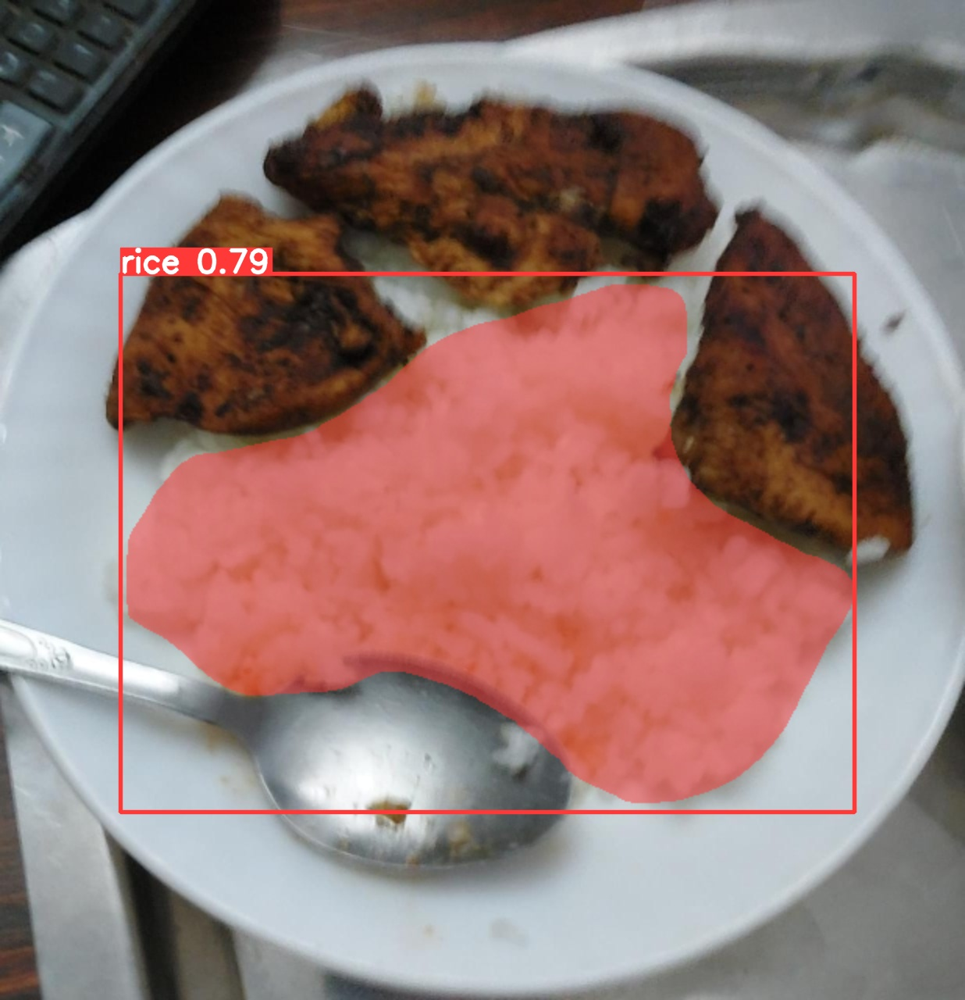

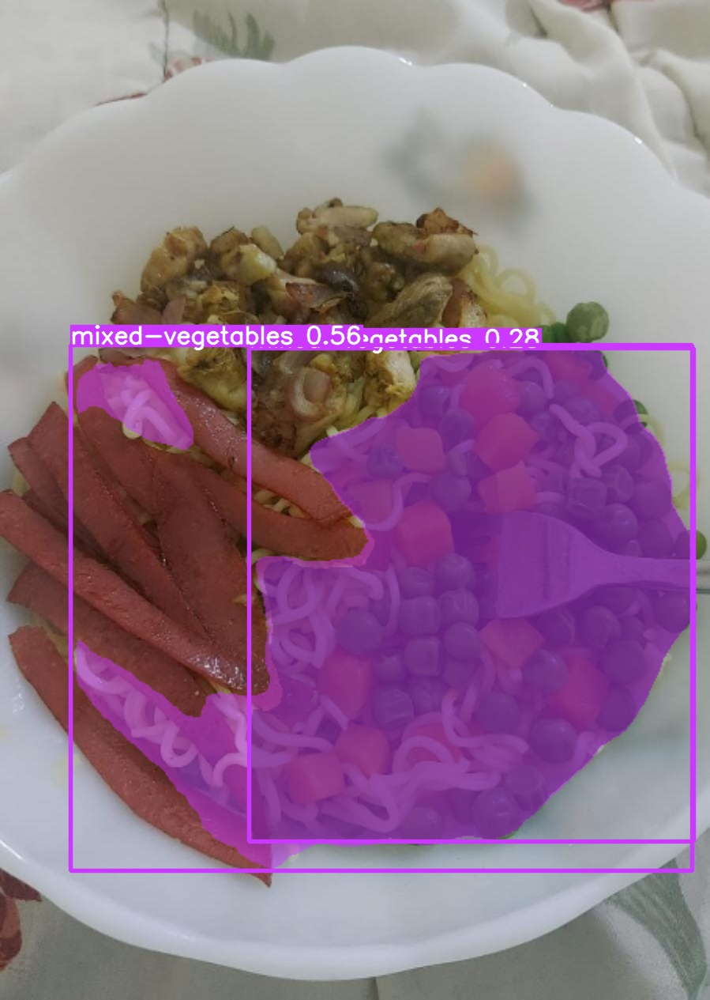

...

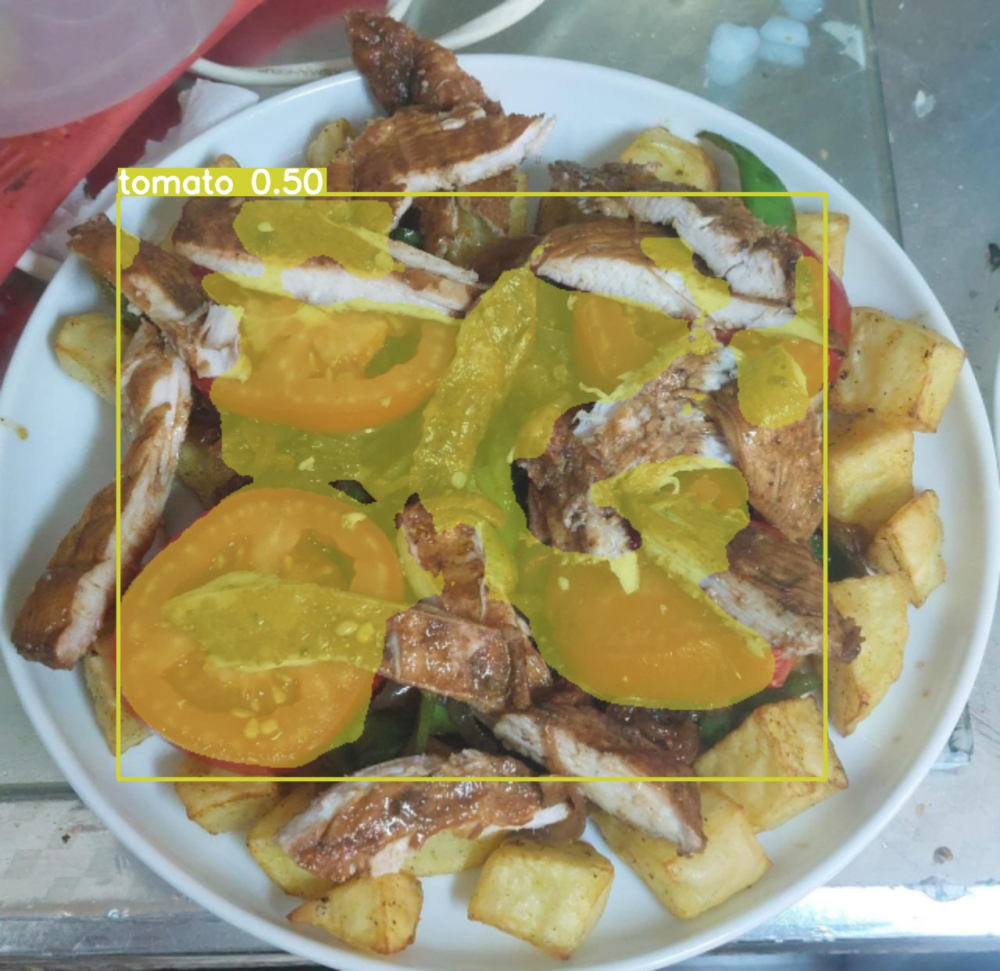

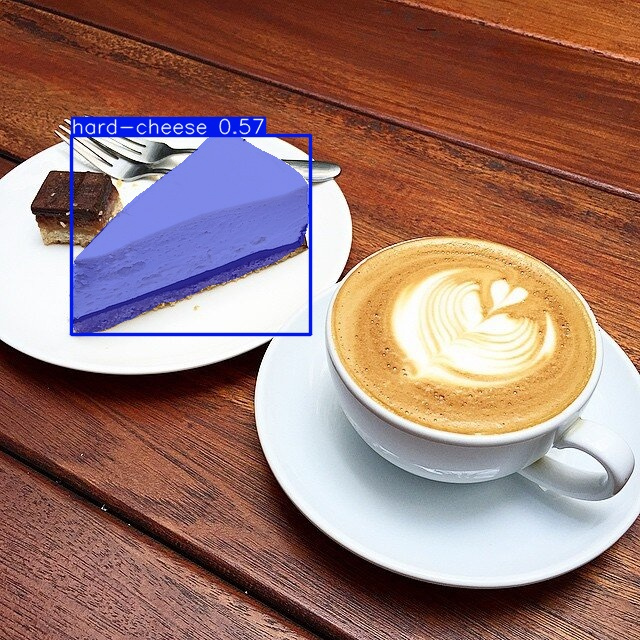

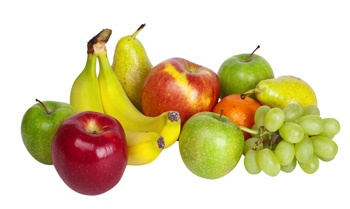

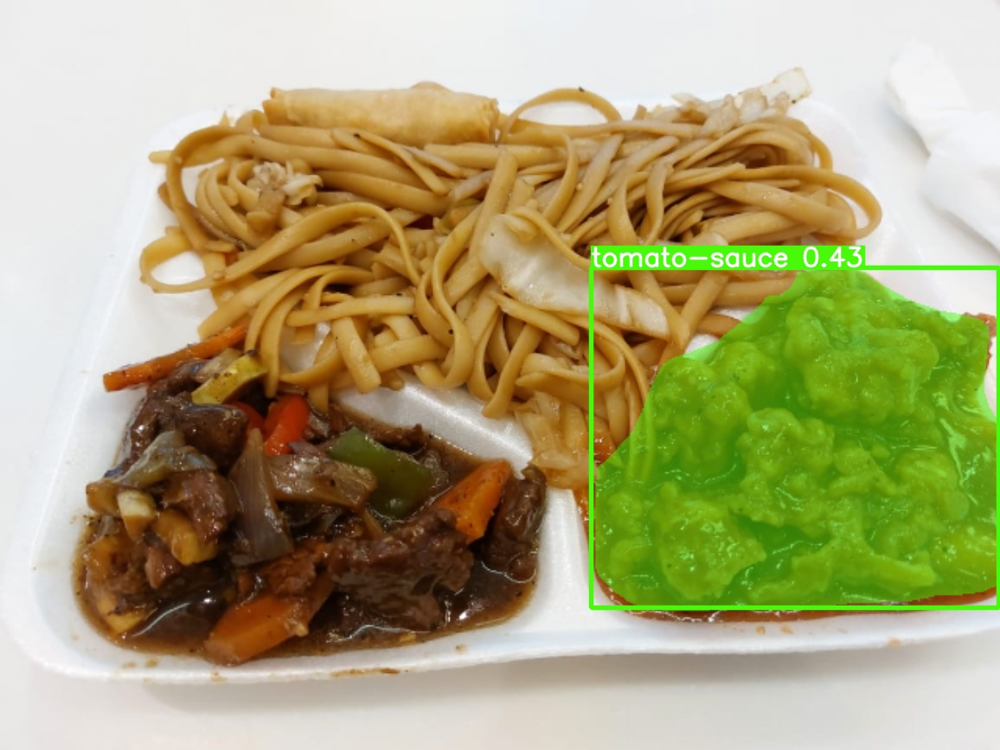

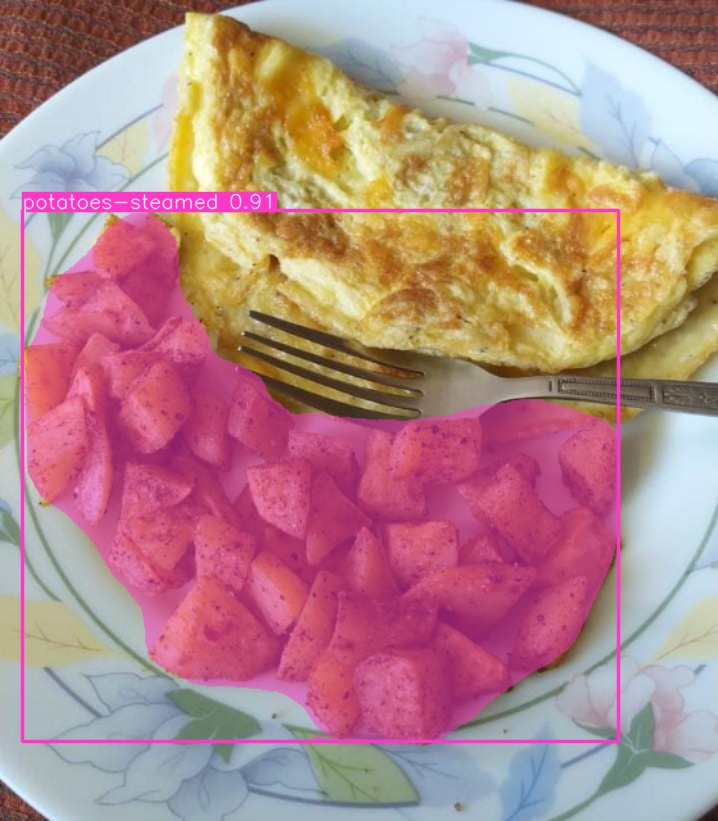

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/segment/predict2/*.jpg')[:20]:
      display(Image(filename=image_path, width=500))
      print("\n")

In [ ]:
project.version(dataset.version).deploy(model_type="yolov8l-seg", model_path=f"/content/runs/segment/train")

Dependency ultralytics==8.0.134 is required but found version=8.0.193, to fix: `pip install ultralytics==8.0.134`
Would you like to continue with the wrong version of ultralytics? y/n: y
An error occured when getting the model upload URL: 404 Client Error: Not Found for url: https://api.roboflow.com/hust-ajpvu/food-srnub/1/uploadModel?api_key=nxKQmigopMbRMy7u295N&modelType=yolov8l-seg&nocache=true


In [ ]:
!yolo export model=/content/runs/segment/train/weights/best.pt format=onnx

Ultralytics YOLOv8.0.193 🚀 Python-3.10.12 torch-2.0.1+cu118 CPU (Intel Xeon 2.30GHz)
YOLOv8l-seg summary (fused): 295 layers, 45935018 parameters, 0 gradients, 220.3 GFLOPs

PyTorch: starting from '/content/runs/segment/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 66, 8400), (1, 32, 160, 160)) (88.1 MB)
requirements: Ultralytics requirement ['onnx>=1.12.0'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.6/14.6 MB 47.5 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 8.8s, installed 1 package: ['onnx>=1.12.0']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.14.1 opset 17...
============= Diagnostic Run torch.onnx.export version 2.0.1+cu118 =============
verbose: False, log level: Level.ERROR
======================= 0 NONE 0 NOTE 0 WARNING 0 ERROR ========================

ONNX: export success ✅ 19.5s, saved as '/content/runs/segment/train/w